In [16]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Load elo ratings dataframe
elo_df = pd.read_pickle("../data/processed/elo_ratings.pkl")

In [17]:
from pathlib import Path

# paths
out_path = Path("../outputs/tables/peak_elo_ratings.md")
out_path.parent.mkdir(parents=True, exist_ok=True)

# build table of peak elos
peak_elo = (
    elo_df.groupby("fighter")["elo"]
    .max()
    .sort_values(ascending=False)
    .round(2)
    .rename("max_elo")
)

peak_elo_df = (
    peak_elo.reset_index()                    
            .head(30)
)

#add rank column
peak_elo_df['rank'] = peak_elo_df['max_elo'].rank(method='first', ascending=False).astype(int)

#sort by rank
peak_elo_df = peak_elo_df.sort_values('rank')

#split into two columns
left = peak_elo_df.iloc[:15][['rank', 'fighter', 'max_elo']].reset_index(drop=True)
right = peak_elo_df.iloc[15:][['rank', 'fighter', 'max_elo']].reset_index(drop=True)

#combine side by side
table = pd.concat([left, right], axis=1)

table.columns = ['Rank', 'Fighter', 'Peak ELO Rating', 'Rank', 'Fighter', 'Peak ELO Rating']

peak_elo_md = table.to_markdown(index=False)

# write as UTF-8
out_path.write_text(peak_elo_md, encoding="utf-8")



1869

In [18]:
# Table of top final elos with activity in last 2 years
recent_date = elo_df['date'].max() - pd.DateOffset(years=2)
final_elos = (
    elo_df.sort_values('date')
           .groupby('fighter')['elo']
           .last()
           .sort_values(ascending=False)
           .round(2)
           .rename('current_elo')
)
recent_fighters = elo_df[elo_df['date'] >= recent_date]['fighter'].unique()
recent_final_elos = final_elos[final_elos.index.isin(recent_fighters)]
print(recent_final_elos.head(30))

# paths
out_path = Path("../outputs/tables/current_rankings.md")
out_path.parent.mkdir(parents=True, exist_ok=True)


current_rankings_df = (
    recent_final_elos.reset_index()                   
            .head(30)
)

#add rank column
current_rankings_df['rank'] = current_rankings_df['current_elo'].rank(method='first', ascending=False).astype(int)

#sort by rank
current_rankings_df = current_rankings_df.sort_values('rank')

#split into two columns
left2 = current_rankings_df.iloc[:15][['rank', 'fighter', 'current_elo']].reset_index(drop=True)
right2 = current_rankings_df.iloc[15:][['rank', 'fighter', 'current_elo']].reset_index(drop=True)

#combine side by side
table2 = pd.concat([left2, right2], axis=1)

table2.columns = ['Rank', 'Fighter', 'ELO Rating', 'Rank', 'Fighter', 'ELO Rating']

current_rankings_md = table2.to_markdown(index=False)

# write as UTF-8
out_path.write_text(current_rankings_md, encoding="utf-8")

fighter
Islam Makhachev          2017.27
Max Holloway             1922.47
Merab Dvalishvili        1916.52
Valentina Shevchenko     1915.46
Charles Oliveira         1911.49
Justin Gaethje           1881.59
Ilia Topuria             1881.32
Alexander Volkanovski    1873.67
Jiri Prochazka           1870.78
Alex Pereira             1868.29
Jon Jones                1858.65
Aljamain Sterling        1852.83
Magomed Ankalaev         1850.57
Shavkat Rakhmonov        1850.38
Alexander Volkov         1839.23
Kamaru Usman             1837.29
Alexandre Pantoja        1837.26
Dricus du Plessis        1836.57
Cris Cyborg              1833.03
Khamzat Chimaev          1832.97
Zhang Weili              1830.83
Ryan Bader               1828.57
Arman Tsarukyan          1821.55
Corey Anderson           1814.36
Movsar Evloev            1813.95
Dustin Poirier           1804.73
Kyoji Horiguchi          1803.47
Francis Ngannou          1802.60
Ciryl Gane               1802.24
Vadim Nemkov             1793.86
Na

1597

In [19]:
print(elo_df["elo"].describe())

count    87054.000000
mean      1432.793741
std        180.770007
min       1071.972459
25%       1260.886738
50%       1490.277035
75%       1549.104869
max       2070.433229
Name: elo, dtype: float64


In [20]:
# Best Fights of All Time
# Step 1: Prepare two mirrored DataFrames
df1 = elo_df[['date', 'fighter', 'opponent', 'elo_pre']].copy()

df2 = df1.rename(columns={
    'fighter': 'opponent',
    'opponent': 'fighter',
    'elo_pre': 'opponent_elo_pre'
})

# Step 2: Merge to get both fighter's elo_pre in the same row
merged = pd.merge(df1, df2, on=['date', 'fighter', 'opponent'])

# Step 3: Create unordered fighter pair to remove mirrored duplicates
merged['fighter_pair'] = merged.apply(
    lambda x: tuple(sorted([x['fighter'], x['opponent']])),
    axis=1
)

# Step 4: Drop duplicated fights based on date and unordered pair
merged_unique = merged.drop_duplicates(subset=['date', 'fighter_pair']).drop(columns='fighter_pair')

# Step 5: Calculate combined Elo before fight
merged_unique['combined_elo_pre'] = merged_unique['elo_pre'] + merged_unique['opponent_elo_pre']

# Step 6: Sort and view top fights
top_combined = merged_unique.sort_values(by='combined_elo_pre', ascending=False)

# Optional: Select columns to view
top_combined = top_combined[['date', 'fighter', 'elo_pre', 'opponent', 'opponent_elo_pre', 'combined_elo_pre']]

print(top_combined.head(20))

top_fights_df = (
    top_combined.loc[:, ['fighter', 'elo_pre', 'opponent', 'opponent_elo_pre', 'combined_elo_pre']]
            .rename(columns={
                "fighter": "Fighter 1",
                "elo_pre": "ELO Rating 1",
                "opponent": "Fighter 2",
                "opponent_elo_pre": "ELO Rating 2",
                "combined_elo_pre": "Combined ELO Rating"})                    
            .reset_index(drop=True)
            .head(10)
)

# Add ranking column (1 to 10)
top_fights_df.insert(0, "Rank", range(1, len(top_fights_df) + 1))

# Save as markdown table
# paths
out_path = Path("../outputs/tables/best_fights_of_all_time.md")
out_path.parent.mkdir(parents=True, exist_ok=True)

top_fights_md = top_fights_df.to_markdown(index=False)

# write as UTF-8
out_path.write_text(top_fights_md, encoding="utf-8")


            date                fighter      elo_pre               opponent  \
73713 2019-08-17         Daniel Cormier  2030.821957           Stipe Miocic   
69776 2018-07-07           Stipe Miocic  1911.876219         Daniel Cormier   
39032 2011-04-30      Georges St-Pierre  1993.454844           Jake Shields   
44668 2012-07-07         Anderson Silva  2042.211139           Chael Sonnen   
75910 2020-08-15         Daniel Cormier  1970.609491           Stipe Miocic   
83318 2023-10-21        Islam Makhachev  1913.840718  Alexander Volkanovski   
50741 2013-11-16        Johny Hendricks  1845.111998      Georges St-Pierre   
40473 2011-08-27         Anderson Silva  2029.783778           Yushin Okami   
55623 2015-01-03         Daniel Cormier  1856.028848              Jon Jones   
70967 2018-11-03         Daniel Cormier  2011.189126          Derrick Lewis   
46227 2012-11-17      Georges St-Pierre  1965.408085          Carlos Condit   
81736 2023-02-12  Alexander Volkanovski  1960.241490

1355

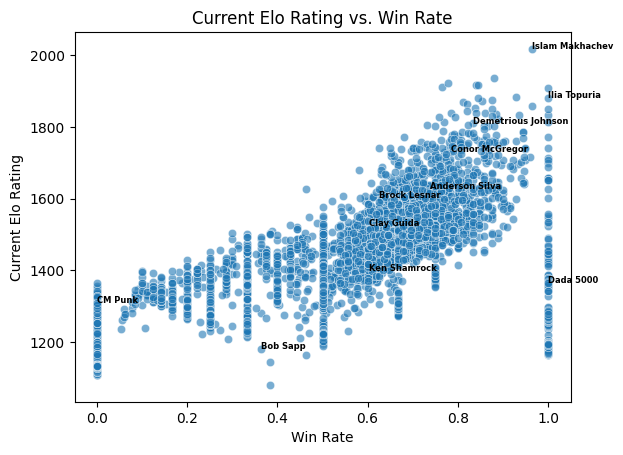

In [21]:
#Plot Elo Rating with Win Rates
# Create win rates
elo_df = elo_df.sort_values(['fighter', 'date'])

fighter_stats = elo_df.groupby('fighter').agg(
    wins=('result', lambda x: (x == 'win').sum()),
    total=('result', 'count')
)
fighter_stats['win_rate'] = fighter_stats['wins'] / fighter_stats['total']

# Merge with Elo
fighter_stats = fighter_stats.merge(final_elos, left_index=True, right_index=True)

# Scatterplot
import seaborn as sns

# Fighters to label
highlighted = ['Anderson Silva', 'Demetrious Johnson', 'Clay Guida', 'Conor McGregor', 'Bob Sapp', 'Brock Lesnar', 'Dada 5000', 'Ilia Topuria', 'CM Punk', 'Islam Makhachev', 'Ken Shamrock']

for name in highlighted:
    if name in fighter_stats.index:
        row = fighter_stats.loc[name]
        plt.text(row['win_rate'], row['current_elo'], name, fontsize=6, weight='semibold')

sns.scatterplot(data=fighter_stats, x='win_rate', y='current_elo', alpha=0.6)
plt.title("Current Elo Rating vs. Win Rate")
plt.xlabel("Win Rate")
plt.ylabel("Current Elo Rating")
plt.savefig("../outputs/figures/elo_vs_win_rate.png")
plt.show()

In [22]:
from matplotlib.dates import DateFormatter, YearLocator

def plot_multiple_elo_trajectories(fighter_names):

    plt.figure(figsize=(14, 7))
    colors = sns.color_palette("husl", len(fighter_names))

    for fighter, color in zip(fighter_names, colors):
        fighter_data = elo_df[elo_df['fighter'] == fighter].sort_values(by='date')

        if fighter_data.empty:
            print(f"No data found for: {fighter}")
            continue

        # Plot line (light) and scatter (emphasis on fights)
        plt.plot(fighter_data['date'], fighter_data['elo'], color=color, alpha=0.4)
        plt.scatter(fighter_data['date'], fighter_data['elo'], color=color, label=fighter, s=45)

        # Highlight peak Elo
        peak_idx = fighter_data['elo'].idxmax()
        plt.scatter(
            fighter_data.loc[peak_idx, 'date'],
            fighter_data.loc[peak_idx, 'elo'],
            color=color,
            edgecolor='black',
            s=120,
            zorder=5
        )

        plt.text(
            fighter_data.loc[peak_idx, 'date'],
            fighter_data.loc[peak_idx, 'elo'] + 5,
            f"{fighter_data.loc[peak_idx, 'elo']:.0f}",
            fontsize=9,
            ha='center'
        )

    plt.title("Elo Rating Trajectories", fontsize=16, weight='bold')
    plt.xlabel("Year", fontsize=13)
    plt.ylabel("Elo Rating", fontsize=13)

    # Force ticks to be at whole years
    ax = plt.gca()
    ax.xaxis.set_major_locator(YearLocator(2))          # 1 tick per year
    ax.xaxis.set_major_formatter(DateFormatter("%Y"))  # Format label as just the year

    plt.xticks(rotation=0)  # keep them horizontal now that they're clean
    plt.grid(alpha=0.25)

    # Move legend outside figure
    plt.legend(loc="center left", bbox_to_anchor=(1, 0.5), frameon=False)

    plt.tight_layout()
    plt.savefig("../outputs/figures/elo_trajectories.png")
    plt.show()


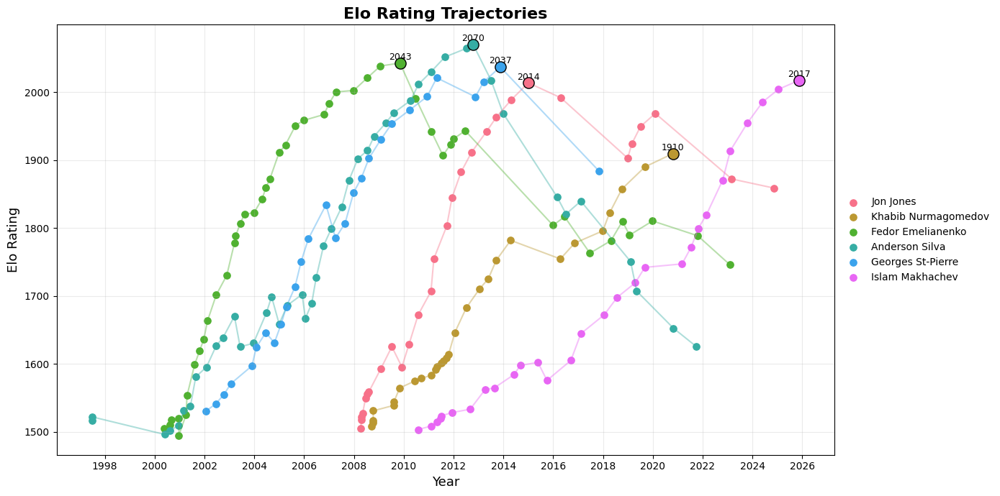

In [23]:
plot_multiple_elo_trajectories(
    ["Jon Jones", "Khabib Nurmagomedov", "Fedor Emelianenko",
     "Anderson Silva", "Georges St-Pierre", "Islam Makhachev"]
)


In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

def animate_elo(fighter_names, rating_col=None, df=None, interval=150):
    """
    Animates Elo progression over time for the given fighters.
    - fighter_names: list of names
    - rating_col: 'elo' (post-fight) or 'elo_pre' (pre-fight). If None, auto-picks.
    - df: DataFrame to use (defaults to one_row_df)
    """
    if df is None:
        df = elo_df  

    # Pick rating column automatically
    if rating_col is None:
        rating_col = 'elo' if 'elo' in df.columns else 'elo_pre'
    assert {'fighter','date',rating_col}.issubset(df.columns), "Missing columns in df"

    # Ensure datetime
    df = df.copy()
    df['date'] = pd.to_datetime(df['date'])

    # Pre-split data per fighter & union of all fight dates
    per_fighter = {}
    for f in fighter_names:
        d = df[df['fighter'] == f].sort_values('date')[['date', rating_col]]
        per_fighter[f] = d

    # If names don’t match exactly you’ll get empties
    # (print a quick diagnostic)
    for f in fighter_names:
        print(f"{f}: {len(per_fighter[f])} fights in data")

    # Build a global sorted date sequence across these fighters
    all_dates = pd.concat([per_fighter[f]['date'] for f in fighter_names if not per_fighter[f].empty],
                          axis=0).drop_duplicates().sort_values().to_list()
    if not all_dates:
        raise ValueError("No dates found for the selected fighters.")

    # Figure + lines
    fig, ax = plt.subplots(figsize=(14, 7))
    try:
        import seaborn as sns
        colors = sns.color_palette("tab10", len(fighter_names))
    except Exception:
        colors = plt.get_cmap('tab10')(range(len(fighter_names)))

    lines = {}
    for f, c in zip(fighter_names, colors):
        line, = ax.plot([], [], label=f, color=c, lw=2)
        lines[f] = line

    # Axes limits
    ymin = df[rating_col].min() - 25
    ymax = df[rating_col].max() + 25
    ax.set_xlim(all_dates[0], all_dates[-1])
    ax.set_ylim(ymin, ymax)
    ax.set_title(f"Elo Rating Trajectories", fontsize=16, weight='bold')
    ax.set_xlabel("Date"); ax.set_ylabel("Elo Rating")
    ax.grid(alpha=0.25)
    ax.legend(loc="center left", bbox_to_anchor=(1,0.5), frameon=False)
    fig.autofmt_xdate()

    # Update function
    def update(i):
        current_date = all_dates[i]
        for f in fighter_names:
            d = per_fighter[f]
            if d.empty:
                continue
            mask = d['date'] <= current_date
            x = d.loc[mask, 'date'].values
            y = d.loc[mask, rating_col].values
            lines[f].set_data(x, y)
        return tuple(lines.values())

    anim = FuncAnimation(fig, update, frames=len(all_dates), interval=interval, blit=False, repeat=False)
    plt.close(fig)  # prevents duplicate static figure
    return anim


In [25]:
anim = animate_elo(["Jon Jones", "Khabib Nurmagomedov", "Fedor Emelianenko",
     "Anderson Silva", "Georges St-Pierre", "Islam Makhachev"], rating_col="elo")
from IPython.display import HTML
HTML(anim.to_jshtml())   # renders inline


Jon Jones: 29 fights in data
Khabib Nurmagomedov: 29 fights in data
Fedor Emelianenko: 47 fights in data
Anderson Silva: 46 fights in data
Georges St-Pierre: 28 fights in data
Islam Makhachev: 29 fights in data


In [26]:
anim = animate_elo(["Jon Jones", "Khabib Nurmagomedov", "Fedor Emelianenko",
     "Anderson Silva", "Georges St-Pierre", "Islam Makhachev"], rating_col="elo")
anim.save("../outputs/figures/elo_animation.gif", writer="pillow", fps=10)

Jon Jones: 29 fights in data
Khabib Nurmagomedov: 29 fights in data
Fedor Emelianenko: 47 fights in data
Anderson Silva: 46 fights in data
Georges St-Pierre: 28 fights in data
Islam Makhachev: 29 fights in data


In [27]:
# Create list of greatest gains/losses in Elo ratings
elo_df['elo_diff'] = elo_df['elo'] - elo_df['elo_pre']
greatest_gains = elo_df.nlargest(10, 'elo_diff')[['fighter', 'opponent', 'date', 'elo_diff']]
greatest_losses = elo_df.nsmallest(10, 'elo_diff')[['fighter', 'opponent', 'date', 'elo_diff']] 
print("Greatest Gains:")
print(greatest_gains)
print("Greatest Losses:")
print(greatest_losses)

Greatest Gains:
                  fighter            opponent       date   elo_diff
48466            TJ Grant        Gray Maynard 2013-05-25  66.427175
75216          Angga Hans        Jeka Saragih 2020-02-15  62.805137
72803       Christian Lee         Shinya Aoki 2019-05-17  62.017263
81802    Fabricio Andrade        John Lineker 2023-02-25  61.798328
68740  Aliaskhab Khizriev   Rousimar Palhares 2018-03-30  61.646240
77362      Adriano Moraes  Demetrious Johnson 2021-04-07  61.595387
49044       Chris Weidman      Anderson Silva 2013-07-06  61.300543
63306     Eduard Folayang         Shinya Aoki 2016-11-11  60.927068
66422    Mukhomad Vakhaev       Denis Goltsov 2017-08-19  60.737286
30195          Ray Mercer          Tim Sylvia 2009-06-13  60.581514
Greatest Losses:
                     fighter            opponent       date   elo_diff
49043         Anderson Silva       Chris Weidman 2013-07-06 -53.300543
86838         Beneil Dariush  Benoit Saint Denis 2025-11-15 -53.278539
80410 

In [28]:
# Convert to wide format for easier plotting

#drop fighters with elo below 1400
elo_df = elo_df[elo_df['elo'] >= 1400]

elo_df_wide = (
    elo_df.pivot_table(index='date', columns='fighter', values='elo')
    .sort_index()
    .fillna(method='ffill')
    .fillna(0)
)

# Resample to monthly (start of month) and forward fill
elo_monthly = (
    elo_df_wide
    .resample('MS')        # 'MS' = Month Start
    .mean()                # average if multiple fights in the same month
    .ffill()               # carry last value forward
)

elo_monthly = elo_monthly.astype('float32')

# drop if year before 1993
elo_monthly = elo_monthly[elo_monthly.index.year >= 1993]

# drop if inactivity (no fights in last 3 years)
recent_date = elo_monthly.index.max() - pd.DateOffset(years=3)
active_fighters = elo_monthly.loc[recent_date:].columns
elo_monthly = elo_monthly[active_fighters]




C:\Users\12152\AppData\Local\Temp\ipykernel_13268\2496208015.py:9: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  .fillna(method='ffill')


In [29]:
import bar_chart_race as bcr

# run the animation
bcr.bar_chart_race(
    df=elo_monthly,                                    
    filename='../outputs/figures/elo_race.gif', 
    n_bars=10,
    cmap='Dark2',
    sort='desc',
    title='MMA Elo Ratings Over Time',
    dpi=144,
    period_length=800,
    interpolate_period=True,
    period_fmt='%Y-%m',
)


c:\Users\12152\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning: Glyph 127 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(io.BytesIO())
c:\Users\12152\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning: Glyph 128 (\x80) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(io.BytesIO())
c:\Users\12152\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning: Glyph 129 (\x81) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(io.BytesIO())
c:\Users\12152\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning: Glyph 130 (\x82) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(io.BytesIO())
c:\Users\12152\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning: Glyph 131 (\x83) missing from font